
TASK 1: Load and Display Original Image


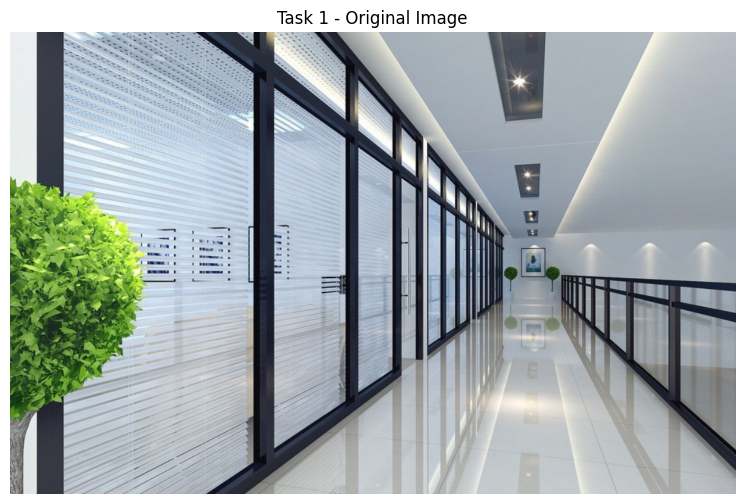


TASK 2: Convert Image to Grayscale


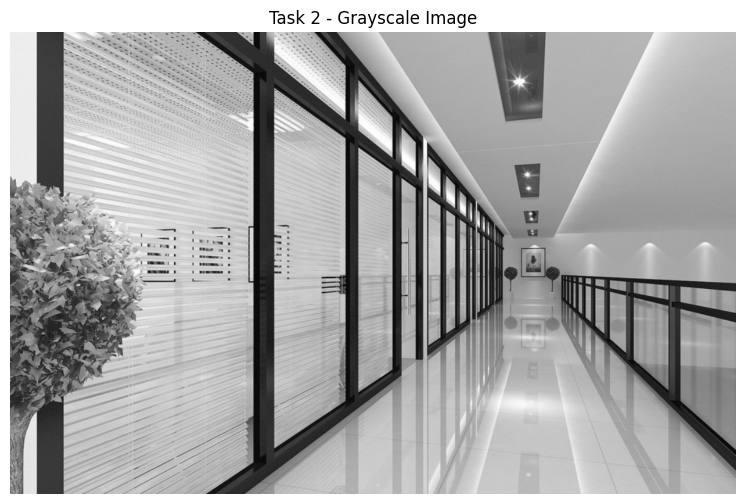


TASK 3: Convert Image to Float32
Original grayscale datatype : uint8
Converted datatype          : float32

TASK 4: Apply Harris Corner Detection
Harris response calculated.
Minimum Harris response : -83122840.0
Maximum Harris response : 82911940.0


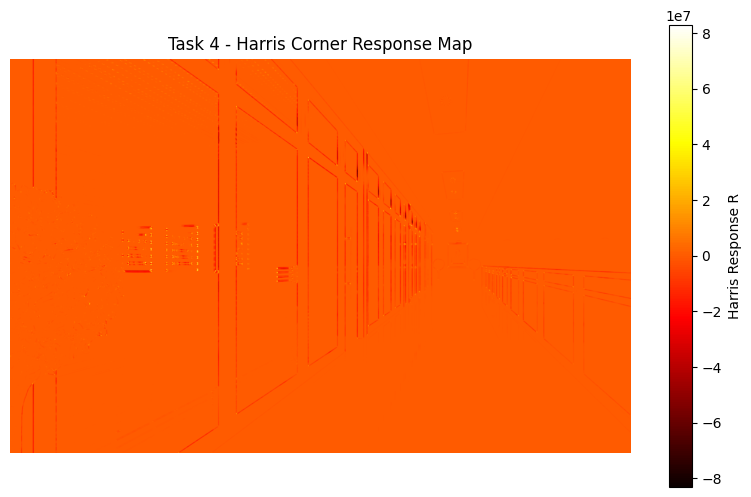


TASK 5: Dilate Harris Responses


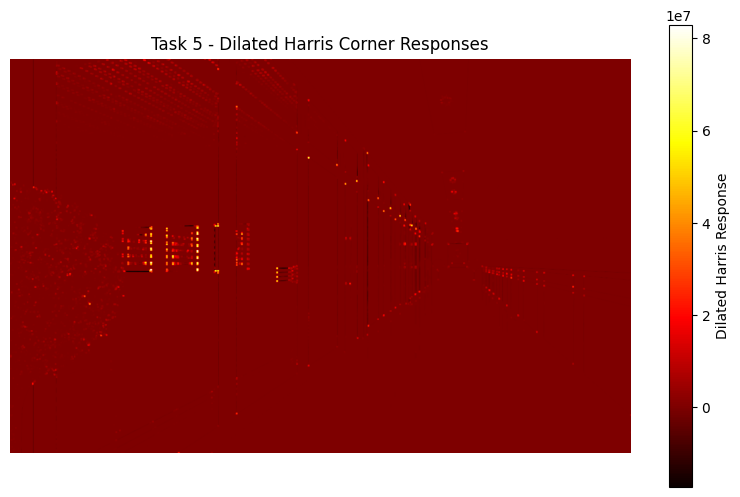


TASK 6: Apply Thresholding


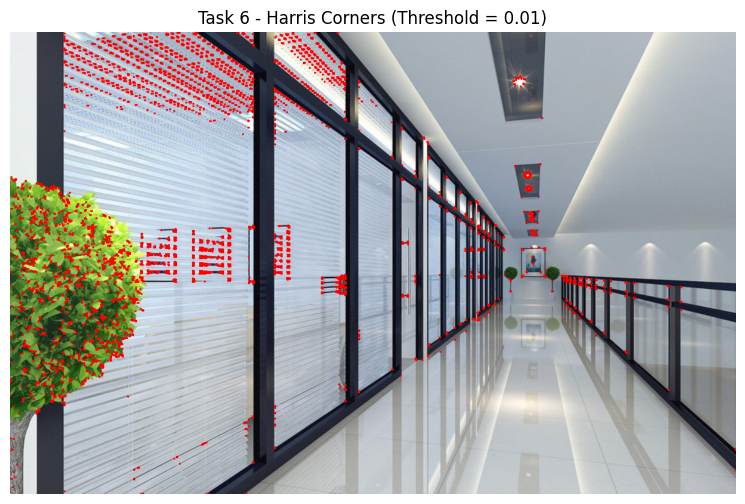


TASK 7: Investigate Threshold Values

----------------------------------------------------------
Threshold | Response Pixels | Distinct Corners
----------------------------------------------------------
0.001      | 83499            | 1004


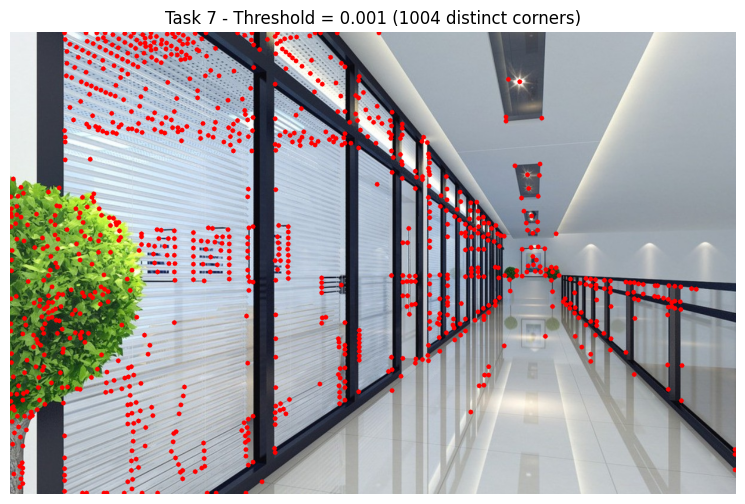

0.005      | 46532            | 1198


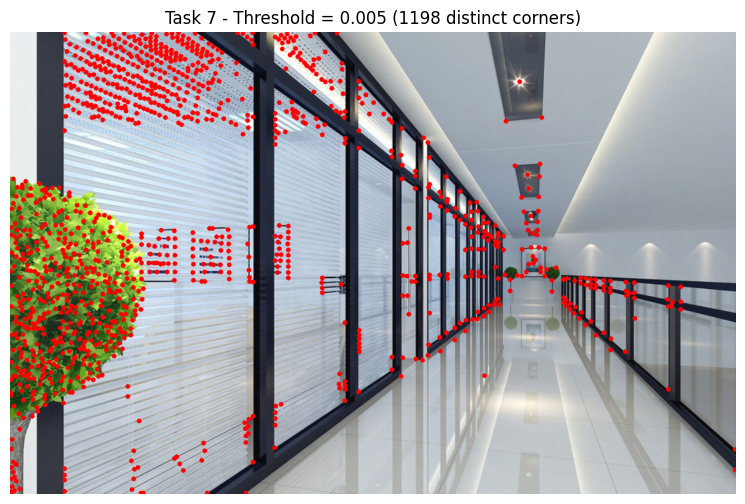

0.01       | 32755            | 1170


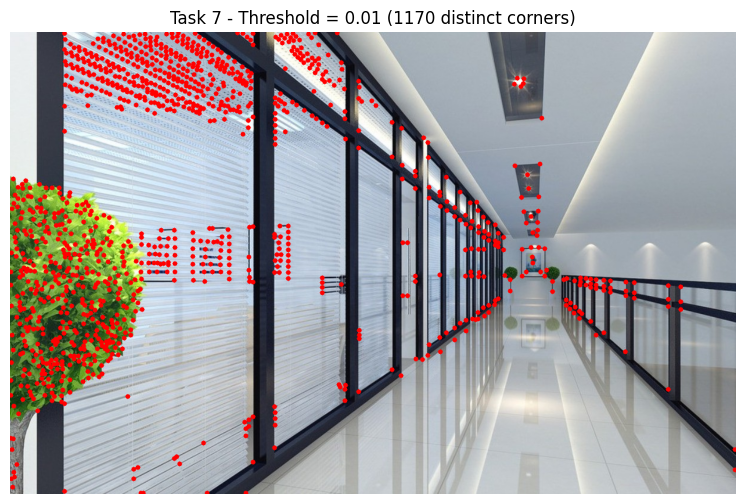

0.05       | 9148             | 506


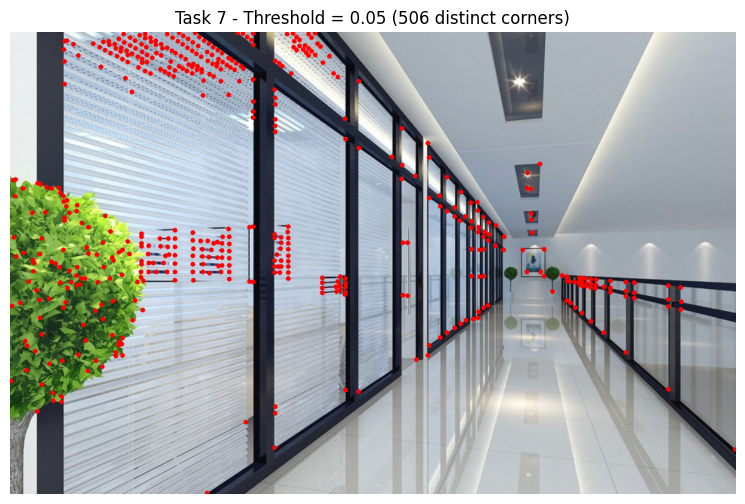


TASK 8: Investigate blockSize
blockSize = 2: 32755 response pixels


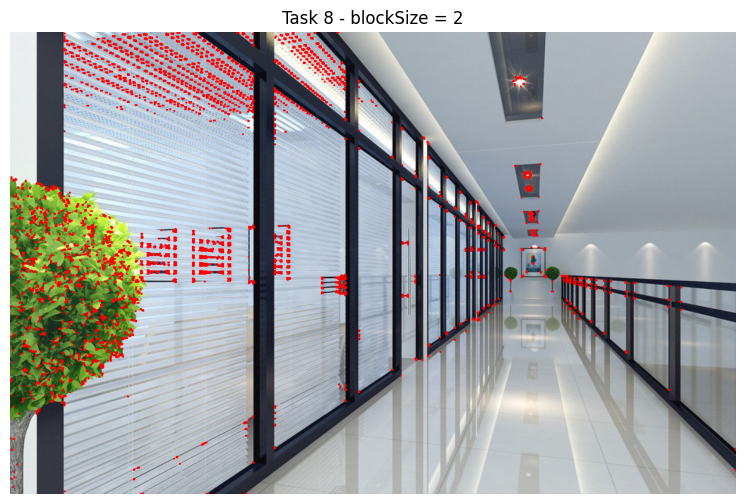

blockSize = 3: 41773 response pixels


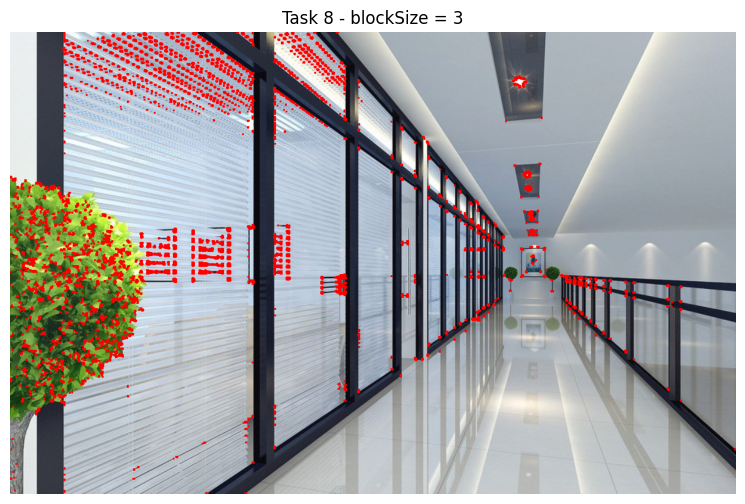

blockSize = 5: 50194 response pixels


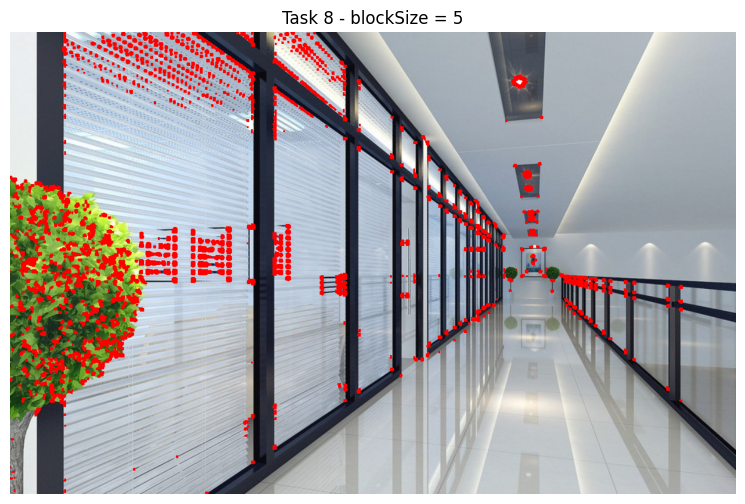

blockSize = 7: 58221 response pixels


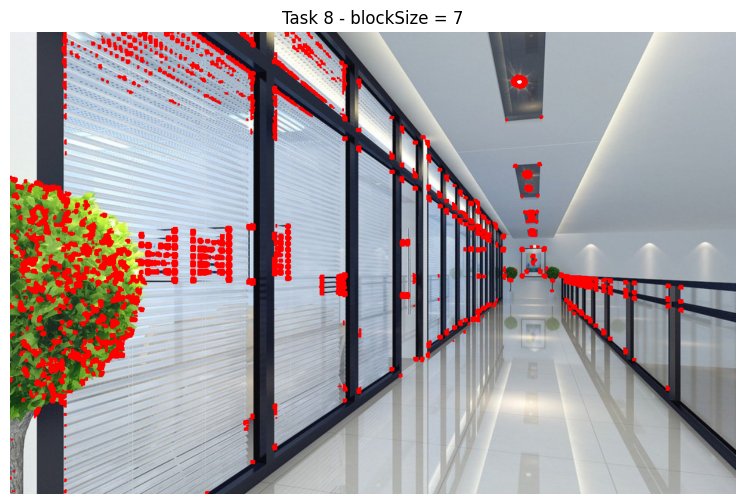


TASK 9: Investigate Harris Parameter k
k = 0.02: 36695 response pixels


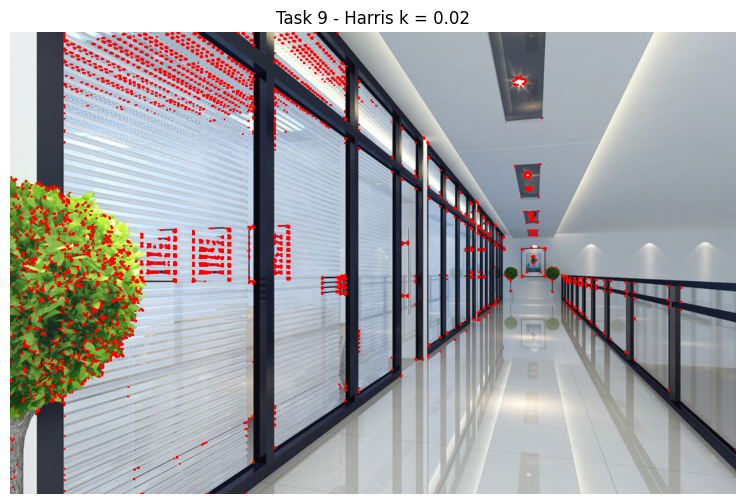

k = 0.04: 32755 response pixels


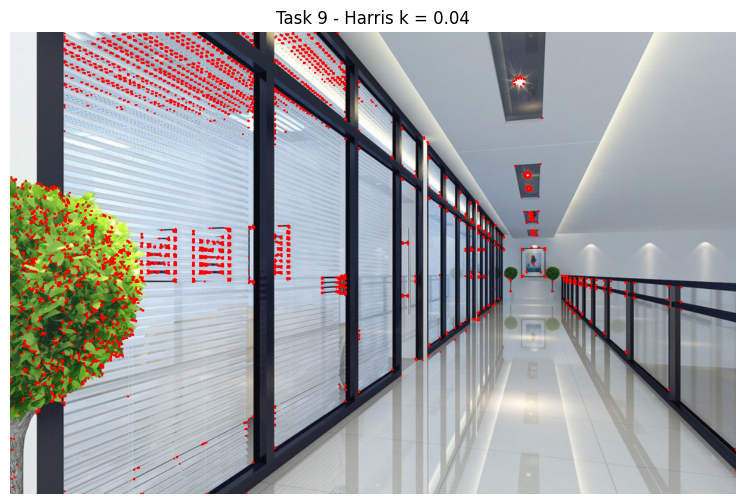

k = 0.06: 29888 response pixels


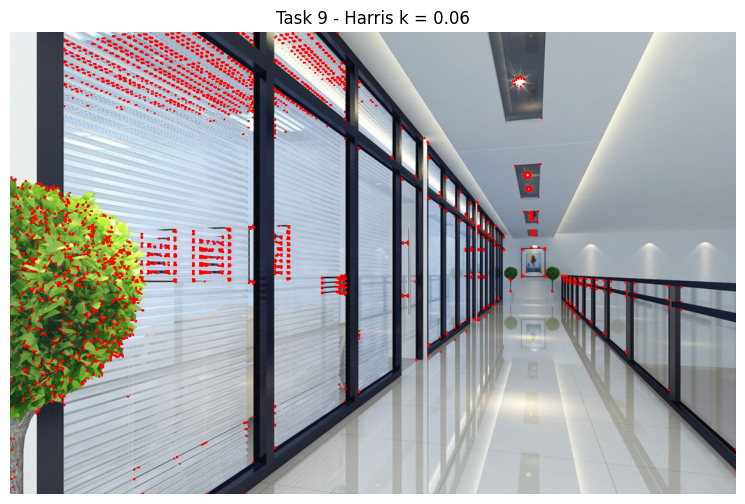

k = 0.08: 27636 response pixels


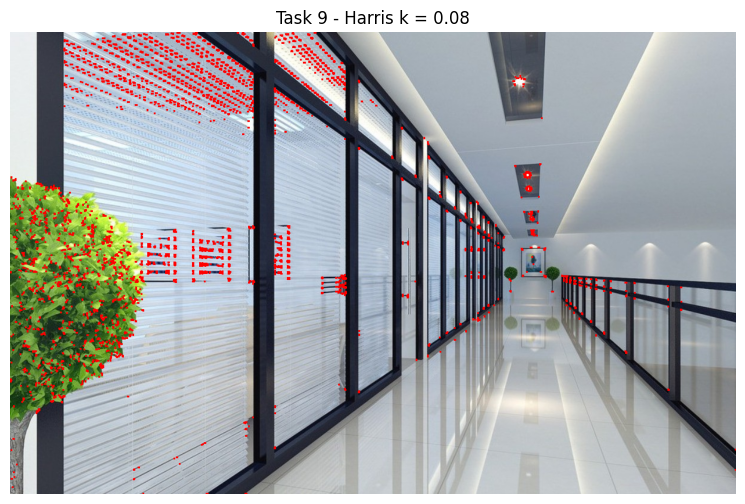


TASK 10: Draw Individual Corner Points
Approximate number of distinct corners: 1875


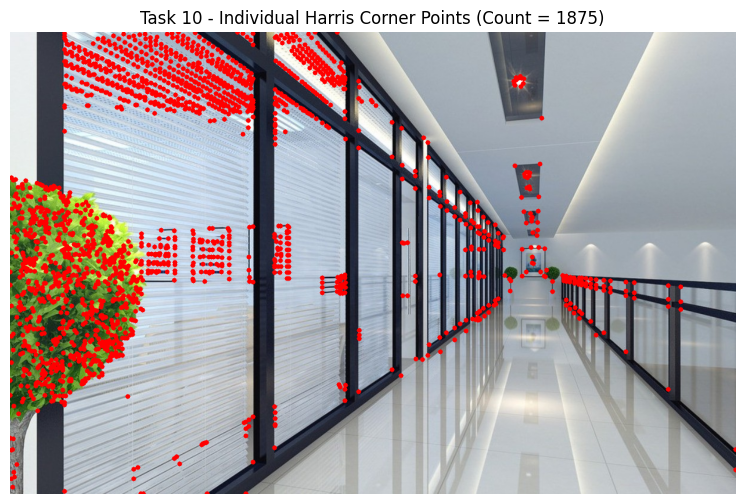


Final Comparison


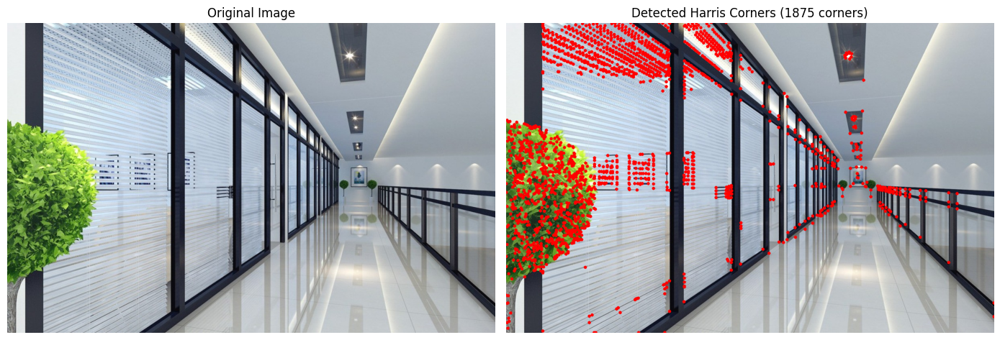


Harris Corner Detection Tasks 1-10 Completed


In [8]:
# ============================================================
# HARRIS CORNER DETECTION USING PYTHON AND OPENCV
# Tasks 1 - 10
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# USER SETTINGS
# ============================================================

IMAGE_PATH = "assets/corridor.jpg"

# Default Harris parameters
BLOCK_SIZE = 2
KSIZE = 3
K = 0.04
THRESHOLD = 0.01


# ============================================================
# HELPER FUNCTION
# ============================================================

def show_image(image, title, grayscale=False):
    """
    Display an image using Matplotlib.
    """

    plt.figure(figsize=(10, 6))

    if grayscale:
        plt.imshow(image, cmap="gray")
    else:
        plt.imshow(image)

    plt.title(title)
    plt.axis("off")
    plt.show()


# ============================================================
# TASK 1 - LOAD AND DISPLAY THE ORIGINAL IMAGE
# ============================================================

print("\nTASK 1: Load and Display Original Image")

img = cv2.imread(IMAGE_PATH)

# Check whether image was loaded correctly
if img is None:
    raise FileNotFoundError(
        f"Image '{IMAGE_PATH}' could not be found. "
        "Check the image path."
    )

# OpenCV uses BGR, whereas Matplotlib uses RGB
img_rgb = cv2.cvtColor(
    img,
    cv2.COLOR_BGR2RGB
)

show_image(
    img_rgb,
    "Task 1 - Original Image"
)


# ============================================================
# TASK 2 - CONVERT IMAGE TO GRAYSCALE
# ============================================================

print("\nTASK 2: Convert Image to Grayscale")

gray = cv2.cvtColor(
    img,
    cv2.COLOR_BGR2GRAY
)

show_image(
    gray,
    "Task 2 - Grayscale Image",
    grayscale=True
)


# ============================================================
# TASK 3 - CONVERT GRAYSCALE IMAGE TO FLOAT32
# ============================================================

print("\nTASK 3: Convert Image to Float32")

gray_float = np.float32(gray)

print("Original grayscale datatype :", gray.dtype)
print("Converted datatype          :", gray_float.dtype)


# ============================================================
# TASK 4 - APPLY HARRIS CORNER DETECTION
# ============================================================

print("\nTASK 4: Apply Harris Corner Detection")

harris_response = cv2.cornerHarris(
    src=gray_float,
    blockSize=BLOCK_SIZE,
    ksize=KSIZE,
    k=K
)

print("Harris response calculated.")
print("Minimum Harris response :", harris_response.min())
print("Maximum Harris response :", harris_response.max())


# Display Harris response map
plt.figure(figsize=(10, 6))

plt.imshow(
    harris_response,
    cmap="hot"
)

plt.colorbar(
    label="Harris Response R"
)

plt.title(
    "Task 4 - Harris Corner Response Map"
)

plt.axis("off")
plt.show()


# ============================================================
# TASK 5 - DILATE CORNER RESPONSES
# ============================================================

print("\nTASK 5: Dilate Harris Responses")

harris_dilated = cv2.dilate(
    harris_response,
    None
)


plt.figure(figsize=(10, 6))

plt.imshow(
    harris_dilated,
    cmap="hot"
)

plt.colorbar(
    label="Dilated Harris Response"
)

plt.title(
    "Task 5 - Dilated Harris Corner Responses"
)

plt.axis("off")
plt.show()


# ============================================================
# TASK 6 - APPLY THRESHOLDING
# ============================================================

print("\nTASK 6: Apply Thresholding")

result = img.copy()

threshold_value = (
    THRESHOLD * harris_dilated.max()
)

result[
    harris_dilated > threshold_value
] = [0, 0, 255]

result_rgb = cv2.cvtColor(
    result,
    cv2.COLOR_BGR2RGB
)

show_image(
    result_rgb,
    f"Task 6 - Harris Corners "
    f"(Threshold = {THRESHOLD})"
)


# ============================================================
# TASK 7 - INVESTIGATE DIFFERENT THRESHOLD VALUES
# ============================================================

print("\nTASK 7: Investigate Threshold Values")

threshold_values = [
    0.001,
    0.005,
    0.01,
    0.05
]

print("\n----------------------------------------------------------")
print("Threshold | Response Pixels | Distinct Corners")
print("----------------------------------------------------------")


for t in threshold_values:

    # --------------------------------------------------------
    # Create a copy of the original image
    # --------------------------------------------------------

    result_threshold = img.copy()


    # --------------------------------------------------------
    # Calculate threshold value
    # --------------------------------------------------------

    threshold_value = (
        t * harris_dilated.max()
    )


    # --------------------------------------------------------
    # Create binary mask
    #
    # Pixels with Harris response greater than the
    # threshold are considered possible corners.
    # --------------------------------------------------------

    corner_mask = (
        harris_dilated > threshold_value
    ).astype(np.uint8)


    # --------------------------------------------------------
    # Count response pixels
    #
    # This counts ALL pixels that passed the threshold.
    # It does NOT represent distinct physical corners.
    # --------------------------------------------------------

    number_pixels = np.count_nonzero(
        corner_mask
    )


    # --------------------------------------------------------
    # Connected Components
    #
    # Neighbouring corner-response pixels are grouped
    # together into connected regions.
    # Each region is treated as approximately one corner.
    # --------------------------------------------------------

    number_labels, labels, stats, centroids = (
        cv2.connectedComponentsWithStats(
            corner_mask
        )
    )


    # --------------------------------------------------------
    # Number of distinct corners
    #
    # Label 0 is the background, so subtract 1.
    # --------------------------------------------------------

    number_corners = number_labels - 1


    # --------------------------------------------------------
    # Draw one point at the centre of each detected corner
    # --------------------------------------------------------

    for i in range(
        1,
        number_labels
    ):

        x = int(
            centroids[i][0]
        )

        y = int(
            centroids[i][1]
        )

        cv2.circle(
            result_threshold,
            (x, y),
            radius=4,
            color=(0, 0, 255),
            thickness=-1
        )


    # --------------------------------------------------------
    # Print results
    # --------------------------------------------------------

    print(
        f"{t:<10} | "
        f"{number_pixels:<16} | "
        f"{number_corners}"
    )


    # --------------------------------------------------------
    # Convert BGR to RGB for Matplotlib
    # --------------------------------------------------------

    result_threshold_rgb = cv2.cvtColor(
        result_threshold,
        cv2.COLOR_BGR2RGB
    )


    # --------------------------------------------------------
    # Display result
    # --------------------------------------------------------

    show_image(
        result_threshold_rgb,
        f"Task 7 - Threshold = {t} "
        f"({number_corners} distinct corners)"
    )


# ============================================================
# TASK 8 - INVESTIGATE BLOCKSIZE
# ============================================================

print("\nTASK 8: Investigate blockSize")

block_sizes = [
    2,
    3,
    5,
    7
]

for block in block_sizes:

    dst_block = cv2.cornerHarris(
        src=gray_float,
        blockSize=block,
        ksize=KSIZE,
        k=K
    )

    dst_block = cv2.dilate(
        dst_block,
        None
    )

    result_block = img.copy()

    threshold_block = (
        THRESHOLD * dst_block.max()
    )

    corner_mask = (
        dst_block > threshold_block
    )

    result_block[
        corner_mask
    ] = [0, 0, 255]

    number_pixels = np.count_nonzero(
        corner_mask
    )

    print(
        f"blockSize = {block}: "
        f"{number_pixels} response pixels"
    )

    result_block_rgb = cv2.cvtColor(
        result_block,
        cv2.COLOR_BGR2RGB
    )

    show_image(
        result_block_rgb,
        f"Task 8 - blockSize = {block}"
    )


# ============================================================
# TASK 9 - INVESTIGATE HARRIS PARAMETER k
# ============================================================

print("\nTASK 9: Investigate Harris Parameter k")

k_values = [
    0.02,
    0.04,
    0.06,
    0.08
]

for k_value in k_values:

    dst_k = cv2.cornerHarris(
        src=gray_float,
        blockSize=BLOCK_SIZE,
        ksize=KSIZE,
        k=k_value
    )

    dst_k = cv2.dilate(
        dst_k,
        None
    )

    result_k = img.copy()

    threshold_k = (
        THRESHOLD * dst_k.max()
    )

    corner_mask = (
        dst_k > threshold_k
    )

    result_k[
        corner_mask
    ] = [0, 0, 255]

    number_pixels = np.count_nonzero(
        corner_mask
    )

    print(
        f"k = {k_value}: "
        f"{number_pixels} response pixels"
    )

    result_k_rgb = cv2.cvtColor(
        result_k,
        cv2.COLOR_BGR2RGB
    )

    show_image(
        result_k_rgb,
        f"Task 9 - Harris k = {k_value}"
    )


# ============================================================
# TASK 10 - DRAW INDIVIDUAL CORNER POINTS
# ============================================================

print("\nTASK 10: Draw Individual Corner Points")


# ------------------------------------------------------------
# Recalculate Harris response WITHOUT dilation.
#
# Dilation is useful for visualisation, but it should not be
# used to determine the precise centre of each corner.
# ------------------------------------------------------------

dst = cv2.cornerHarris(
    src=gray_float,
    blockSize=BLOCK_SIZE,
    ksize=KSIZE,
    k=K
)


# ------------------------------------------------------------
# Threshold strong Harris responses
# ------------------------------------------------------------

threshold_value = (
    THRESHOLD * dst.max()
)

corner_mask = (
    dst > threshold_value
).astype(np.uint8)


# ------------------------------------------------------------
# Connected Components
#
# Several neighbouring pixels may represent the same physical
# corner. Connected components group them together.
# ------------------------------------------------------------

number_labels, labels, stats, centroids = (
    cv2.connectedComponentsWithStats(
        corner_mask
    )
)


# ------------------------------------------------------------
# Draw one circle at the centroid of each detected region.
#
# Label 0 represents the background, therefore start at 1.
# ------------------------------------------------------------

result_points = img.copy()

corner_count = 0

for i in range(
    1,
    number_labels
):

    x = int(
        centroids[i][0]
    )

    y = int(
        centroids[i][1]
    )

    cv2.circle(
        result_points,
        (x, y),
        radius=4,
        color=(0, 0, 255),
        thickness=-1
    )

    corner_count += 1


print(
    "Approximate number of distinct corners:",
    corner_count
)


result_points_rgb = cv2.cvtColor(
    result_points,
    cv2.COLOR_BGR2RGB
)

show_image(
    result_points_rgb,
    f"Task 10 - Individual Harris Corner Points "
    f"(Count = {corner_count})"
)


# ============================================================
# OPTIONAL: DISPLAY ORIGINAL AND FINAL RESULTS SIDE BY SIDE
# ============================================================

print("\nFinal Comparison")

plt.figure(figsize=(14, 6))


plt.subplot(1, 2, 1)

plt.imshow(img_rgb)

plt.title(
    "Original Image"
)

plt.axis("off")


plt.subplot(1, 2, 2)

plt.imshow(result_points_rgb)

plt.title(
    f"Detected Harris Corners "
    f"({corner_count} corners)"
)

plt.axis("off")


plt.tight_layout()
plt.show()


# ============================================================
# END OF PROGRAM
# ============================================================

print("\n==============================================")
print("Harris Corner Detection Tasks 1-10 Completed")
print("==============================================")